# Bee Wing Classification


# Authors

- Nicolae Istratii <nicolae.istratii@epita.fr>
- Andrii Hrona <andrii.hrona@epita.fr>


We were given a dataset of 32 images of bee wings. There is a total of 4 genus and 12 species.

| Genus        | Species            | Count | Total |
| ------------ | ------------------ | ----- | ----- |
| Agapostemon  | Texanus            | 3     | 3     |
|              |                    |       |       |
|              | Rohweri            | 7     |       |
|              | Leucozonium        | 5     |       |
|              | Nymphaerum         | 5     |       |
| Lasioglossum | Pilosum            | 3     | 24    |
|              | Zonulum            | 1     |       |
|              | Zephyrum           | 2     |       |
|              | Mawispb            | 1     |       |
|              |                    |       |       |
| Megachile    | Latimanus          | 1     | 1     |
|              |                    |       |       |
|              | Texana             | 1     |       |
| Osmia        | Lignaria           | 2     | 4     |
|              | Lignaria Propinqua | 1     |       |


The goal of this subject is to build a pipeline to classify a bee genus OR species simply by the bee wing image.


The algorithm:

1. Preprocessing
2. Labelization
3. Identification
4. Feature Extraction
5. Classification


In [1]:
DATA_DIR = "./data"
RANDOM_STATE = 0

In [2]:
import os
from skimage.io import imread

bee_wing_image_paths = [os.path.join(DATA_DIR, path) for path in os.listdir(DATA_DIR)]
bee_wing_images_amount = len(bee_wing_image_paths)
bee_wing_images = [imread(path) for path in bee_wing_image_paths]

### Display the dataset


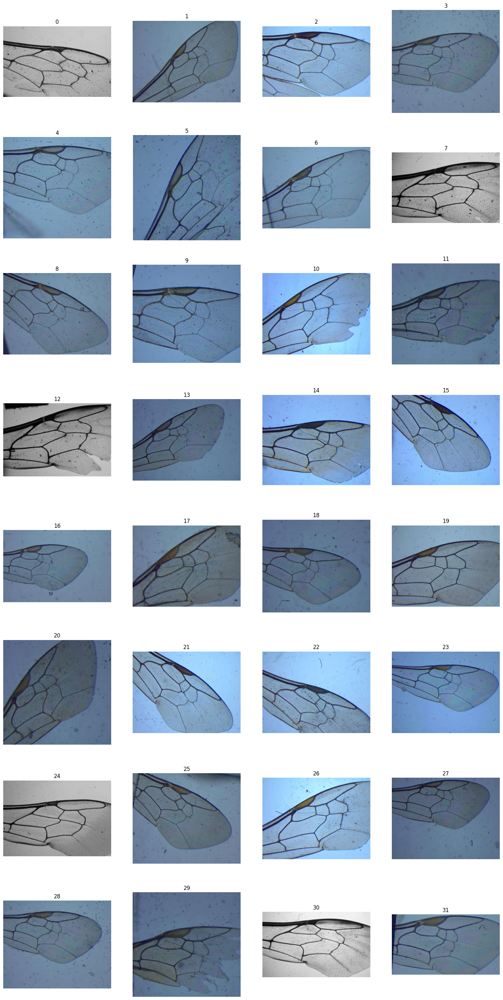

In [3]:
from matplotlib import pyplot as plt

fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii, image in enumerate(bee_wing_images):
    rr, cc = ii // 4, ii % 4
    axes[rr, cc].imshow(image)
    axes[rr, cc].set_title(str(ii))
    axes[rr, cc].axis("off")

The image at the index 5 is not fully visible. In fact the marginal cell is cropped. We consider that this image is invalid. Fortunaly, this image is lasioglossum nymphaerum, there are other images for this species.

Thus, only 31 images of the given dataset is valid.


In [4]:
from enum import Enum, auto


class Species(int, Enum):
    OSMIA_TEXANA = auto()
    LASIOGLOSSUM_ROHWERI = auto()
    LASIOGLOSSUM_LEUCOZONIUM = auto()
    LASIOGLOSSUM_NYMPHAERUM = auto()
    OSMIA_LIGNARIA_PROPINQUA = auto()
    AGAPOSTEMON_TEXANUS = auto()
    LASIOGLOSSUM_PILOSUM = auto()
    OSMIA_LIGNARIA = auto()
    LASIOGLOSSUM_ZONULUM = auto()
    LASIOGLOSSUM_ZEPHYRUM = auto()
    LASIOGLOSSUM_MAWISPB = auto()
    MEGACHILE_LATIMANUS = auto()

class Genus(int, Enum):
    OSMIA = auto()
    LASIOGLOSSUM = auto()
    AGAPOSTEMON = auto()
    MEGACHILE = auto()

In [5]:
import re


def species_name_from_path(path):
    basename = path.split("/")[-1]
    pattern = r"^[0-9]+ ([a-zA-Z -]+) [a-z] (left|right) [0-9.]+x\.jpg$"
    res = re.findall(pattern, basename)
    return res[0][0] if res else None


def genus_name_from_path(path):
    name = species_name_from_path(path)
    return None if name is None else name.split(" ")[0]

# 1. Preprocessing


There are some images where the veins are clearly seen and equally pronounced, but this is not always the case.


In [6]:
import numpy as np
from skimage.color import rgb2gray
from skimage.exposure import equalize_hist
from skimage.filters import sobel, threshold_otsu
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects


def preprocess_well_pronounced(img, small_objects_min_size=4096):
    if img.ndim > 3:
        raise RuntimeError("Unhandled dim")
    elif img.ndim == 3:
        img = rgb2gray(img)
    img_norm = equalize_hist(img)
    img_norm_sobel = sobel(img_norm)
    img = img + img_norm_sobel
    t = threshold_otsu(img)
    img = img < t
    img = remove_small_objects(img, min_size=small_objects_min_size)
    regions = regionprops(img * 1)  # convert mask to integer
    region_areas = np.array([region.area for region in regions])
    largest_region = regions[np.argmax(region_areas)]
    coords = largest_region.coords
    res = np.zeros_like(img, dtype=bool)
    res[coords[:, 0], coords[:, 1]] = True
    return res

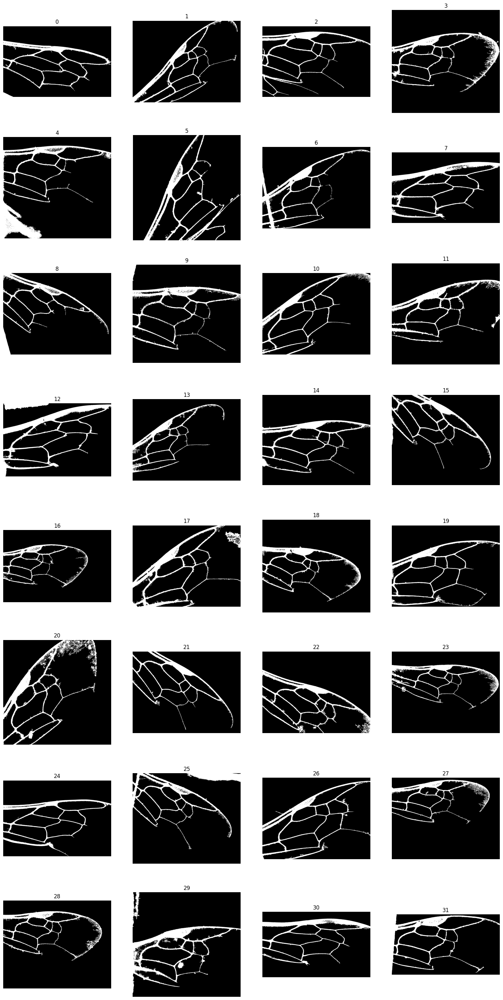

In [7]:
from matplotlib import pyplot as plt

fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii, image in enumerate(bee_wing_images):
    rr, cc = ii // 4, ii % 4
    axes[rr, cc].imshow(preprocess_well_pronounced(image), cmap="gray")
    axes[rr, cc].set_title(str(ii))
    axes[rr, cc].axis("off")

As said above, for the images where the veins are not equally pronounced it is not enough to use a global threshold.


In order to fix this, let's try to use a local otsu.


In [8]:
import numpy as np
from skimage import draw, transform
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from skimage.morphology import reconstruction, remove_small_objects


def _largest_region_only(img_bin):
    img_bin = remove_small_objects(img_bin)
    regions = regionprops(label(img_bin))
    region_areas = np.array([region.area for region in regions])
    largest_region = regions[np.argmax(region_areas)]
    coords = largest_region.coords
    res = np.zeros_like(img_bin, dtype=bool)
    res[coords[:, 0], coords[:, 1]] = True
    return res


def _local_otsu_bis(img_gray, block_size=128, offset=16):
    hh, ww = img_gray.shape
    res = np.zeros_like(img_gray, dtype=bool)
    for ii in range(hh // block_size):
        for jj in range(ww // block_size):
            yy = offset + ii * block_size
            xx = offset + jj * block_size
            block = img_gray[yy : yy + block_size, xx : xx + block_size]
            block = block > threshold_otsu(block, 64)
            res[yy : yy + block_size, xx : xx + block_size] = block
    return res


def _local_otsu(img_gray, block_size=128, offset=16, iterations=None):
    if iterations is None and block_size % offset != 0:
        raise ValueError("_local_otsu: block_size must be a multiplte of offset")
    img_cum = np.zeros_like(img_gray, dtype=int)
    for ii in range(iterations if iterations is not None else block_size // offset):
        img_bin = _local_otsu_bis(img_gray, block_size, offset * ii)
        img_cum = img_bin + img_cum
    return img_cum > threshold_otsu(img_cum, 64)


def _reconstruct(img_mask):
    seed = np.copy(img_mask)
    seed[1:-1, 1:-1] = True
    return reconstruction(seed, img_mask, "erosion")


def _remove_white_border(img_bin):
    hh, ww = img_bin.shape
    ii = 0
    # remove top border
    while ii < hh and np.all(img_bin[ii, :] == 1):
        ii += 1
    if ii < hh:
        img_bin = img_bin[ii:, :]
        hh = hh - ii
    # remove bottom border
    ii = hh - 1
    while ii > 0 and np.all(img_bin[ii, :] == 1):
        ii -= 1
    if ii > 0:
        img_bin = img_bin[: ii + 1, :]
        hh = ii + 1
    # remove left border
    ii = 0
    while ii < ww and np.all(img_bin[:, ii] == 1):
        ii += 1
    if ii < ww:
        img_bin = img_bin[:, ii:]
        ww = ww - ii
    # remove right border
    ii = ww - 1
    while ii > 0 and np.all(img_bin[:, ii] == 1):
        ii -= 1
    if ii > 0:
        img_bin = img_bin[:, : ii + 1]
        ww = ii + 1
    return img_bin


def _link_edges(img_bin):
    res = np.zeros_like(img_bin)
    for line in transform.probabilistic_hough_line(
        img_bin,
        threshold=10,
        line_length=50,
        line_gap=32,
        rng=0,
    ):
        (c0, r0), (c1, r1) = line
        rr, cc = draw.line(r0, c0, r1, c1)
        res[rr, cc] = 1
    return res


def preprocess_weakly_pronounced(img, otsu_block_size=128):
    if img.ndim > 3:
        raise RuntimeError("Unhandled dim")
    elif img.ndim == 3:
        img = rgb2gray(img)
    img = _local_otsu(img, block_size=otsu_block_size)
    img = _reconstruct(img)
    img = img.astype(bool)
    img = ~img
    img = img.astype(int)
    img = _remove_white_border(img)
    img = _link_edges(img)
    img = _largest_region_only(img)
    return img

/tmp/ipykernel_77330/2256330533.py:10: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  img_bin = remove_small_objects(img_bin)


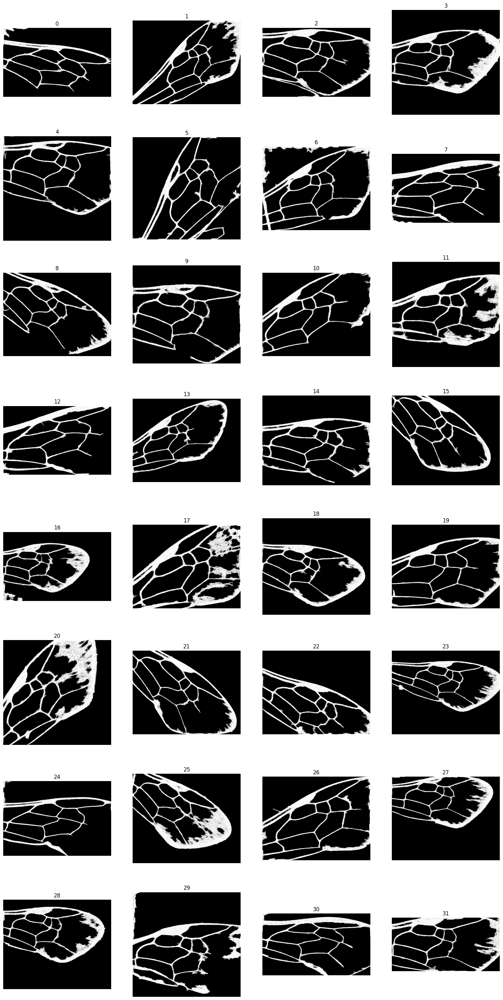

In [9]:
from matplotlib import pyplot as plt

fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii, image in enumerate(bee_wing_images):
    rr, cc = ii // 4, ii % 4
    axes[rr, cc].imshow(preprocess_weakly_pronounced(image), cmap="gray")
    axes[rr, cc].set_title(str(ii))
    axes[rr, cc].axis("off")

Much better but for some images, the block size for the local otsu needs to be adapted.


/tmp/ipykernel_77330/2256330533.py:10: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  img_bin = remove_small_objects(img_bin)


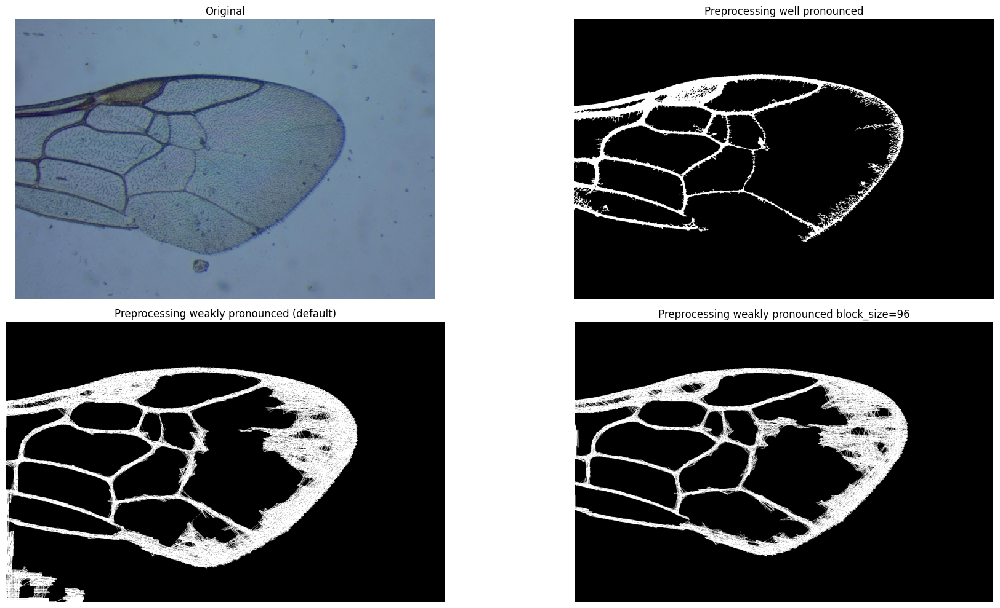

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes[0, 0].imshow(bee_wing_images[16])
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")
axes[0, 1].imshow(preprocess_well_pronounced(bee_wing_images[16]), cmap="gray")
axes[0, 1].set_title("Preprocessing well pronounced")
axes[0, 1].axis("off")
axes[1, 0].imshow(preprocess_weakly_pronounced(bee_wing_images[16]), cmap="gray")
axes[1, 0].set_title("Preprocessing weakly pronounced (default)")
axes[1, 0].axis("off")
axes[1, 1].imshow(preprocess_weakly_pronounced(bee_wing_images[16], otsu_block_size=96), cmap="gray")
axes[1, 1].set_title("Preprocessing weakly pronounced block_size=96")
axes[1, 1].axis("off")
plt.tight_layout()
plt.show()

Some thin veins are much thicker now (thus, more immune to erosion).

/tmp/ipykernel_77330/2256330533.py:10: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  img_bin = remove_small_objects(img_bin)


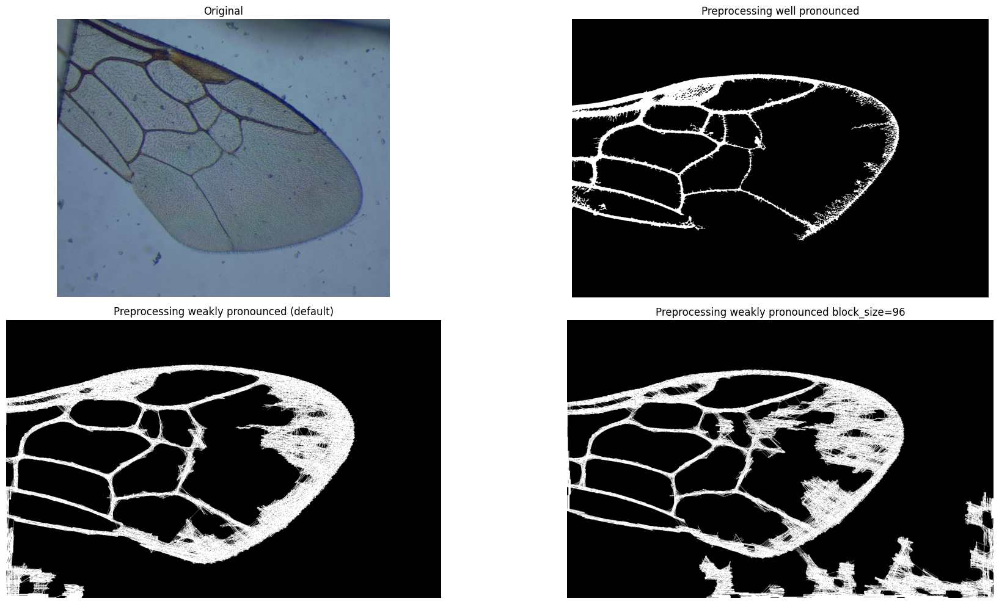

In [11]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes[0, 0].imshow(bee_wing_images[25])
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")
axes[0, 1].imshow(preprocess_well_pronounced(bee_wing_images[16]), cmap="gray")
axes[0, 1].set_title("Preprocessing well pronounced")
axes[0, 1].axis("off")
axes[1, 0].imshow(preprocess_weakly_pronounced(bee_wing_images[16]), cmap="gray")
axes[1, 0].set_title("Preprocessing weakly pronounced (default)")
axes[1, 0].axis("off")
axes[1, 1].imshow(preprocess_weakly_pronounced(bee_wing_images[16], otsu_block_size=64), cmap="gray")
axes[1, 1].set_title("Preprocessing weakly pronounced block_size=96")
axes[1, 1].axis("off")
plt.tight_layout()
plt.show()

/tmp/ipykernel_77330/2256330533.py:10: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  img_bin = remove_small_objects(img_bin)


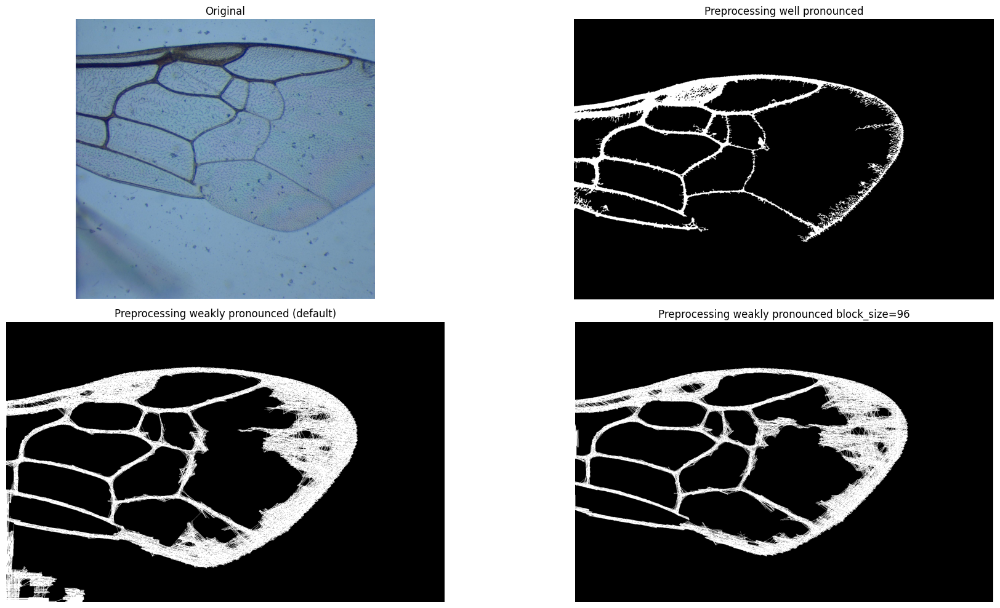

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes[0, 0].imshow(bee_wing_images[4])
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")
axes[0, 1].imshow(preprocess_well_pronounced(bee_wing_images[16]), cmap="gray")
axes[0, 1].set_title("Preprocessing well pronounced")
axes[0, 1].axis("off")
axes[1, 0].imshow(preprocess_weakly_pronounced(bee_wing_images[16]), cmap="gray")
axes[1, 0].set_title("Preprocessing weakly pronounced (default)")
axes[1, 0].axis("off")
axes[1, 1].imshow(preprocess_weakly_pronounced(bee_wing_images[16], otsu_block_size=96), cmap="gray")
axes[1, 1].set_title("Preprocessing weakly pronounced block_size=96")
axes[1, 1].axis("off")
plt.tight_layout()
plt.show()

In [13]:
INVALID = ["133 Lasioglossum nymphaerum f left 4x.jpg"]
PROBLEMATIC = [
    "154 Lasioglossum nymphaerum f right 4x.jpg",
    "65 Lasioglossum nymphaerum f right 4x.jpg",
    "85 Lasioglossum rohweri f right 4x.jpg",
    "119 Lasioglossum rohweri f left 4x.jpg",
    "49 Lasioglossum pilosum f right 4x.jpg",
]

In [14]:
bee_wing_images_bin = []
for ii, path in enumerate(bee_wing_image_paths):
    name = path.split("/")[-1]
    if name in INVALID:
        bee_wing_images_bin.append(None)
    elif name == "85 Lasioglossum rohweri f right 4x.jpg":
        bee_wing_images_bin.append(
            preprocess_weakly_pronounced(bee_wing_images[ii], 96)
        )
    elif name == "133 Lasioglossum nymphaerum f right 4x.jpg":
        bee_wing_images_bin.append(
            preprocess_weakly_pronounced(bee_wing_images[ii], 96)
        )
    elif name == "149 Lasioglossum rohweri f left 4x.jpg":
        bee_wing_images_bin.append(
            preprocess_weakly_pronounced(bee_wing_images[ii], 64)
        )
    elif name in PROBLEMATIC:
        bee_wing_images_bin.append(preprocess_weakly_pronounced(bee_wing_images[ii]))
    else:
        bee_wing_images_bin.append(preprocess_well_pronounced(bee_wing_images[ii]))

/tmp/ipykernel_77330/2256330533.py:10: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  img_bin = remove_small_objects(img_bin)


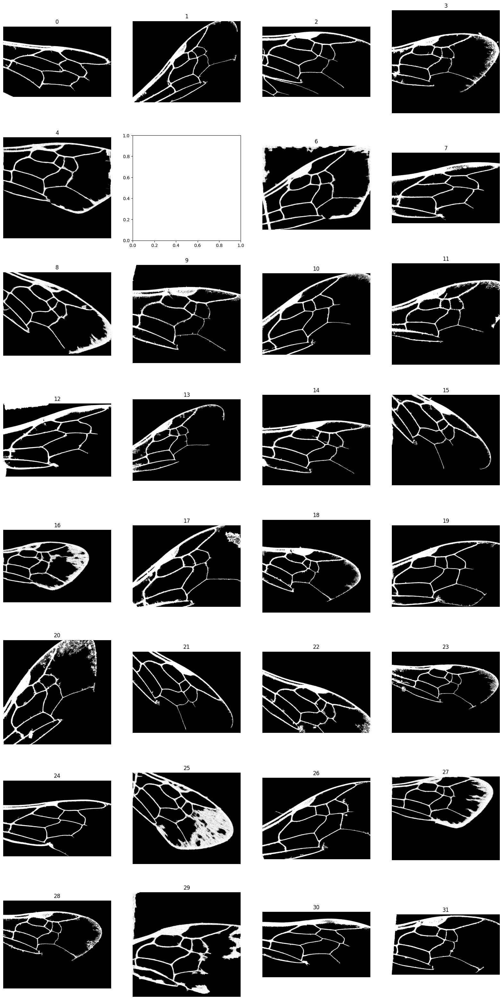

In [15]:
from matplotlib import pyplot as plt

fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii, image_bin in enumerate(bee_wing_images_bin):
    if image_bin is not None:
        rr, cc = ii // 4, ii % 4
        axes[rr, cc].imshow(image_bin, cmap="gray")
        axes[rr, cc].set_title(str(ii))
        axes[rr, cc].axis("off")

# 2. Labellisation

In [16]:
import numpy as np
from scipy.ndimage import binary_fill_holes
from skimage.measure import label, regionprops
from skimage.morphology import binary_dilation, disk


def label_cells(img_bin, mincov=0.00125):
    img_bin = ~img_bin
    regions = regionprops(label(img_bin))

    def _is_big_enough(region):
        return region.num_pixels > img_bin.size * mincov

    def _is_not_touching_the_border(region):
        y = region.coords[:, 0]
        x = region.coords[:, 1]
        h, w = img_bin.shape
        return (
            not np.any(y == 0)
            and not np.any(x == 0)
            and not np.any(y == h - 1)
            and not np.any(x == w - 1)
        )

    regions = list(filter(_is_big_enough, regions))
    regions = list(filter(_is_not_touching_the_border, regions))
    res = np.zeros_like(img_bin, dtype=np.uint8)
    for ii, region in enumerate(regions):
        tmp = np.zeros_like(res, dtype=bool)
        tmp[region.coords[:, 0], region.coords[:, 1]] = True
        tmp_dilated = binary_dilation(tmp, disk(21))
        tmp = tmp_dilated & ~tmp
        tmp = binary_fill_holes(tmp)
        tmp = tmp.astype(bool)
        res[tmp] = ii + 1
    regions = regionprops(label(res))

    def _is_not_touching_right_border(region):
        x = region.coords[:, 1]
        _, w = res.shape
        return not np.any(x == w - 1)

    regions = list(filter(_is_big_enough, regions))
    regions = list(filter(_is_not_touching_right_border, regions))
    res = np.zeros_like(img_bin, dtype=np.uint8)
    for ii, region in enumerate(regions):
        res[region.coords[:, 0], region.coords[:, 1]] = ii + 1
    regions = regionprops(res)
    return res, regions

In [17]:
bee_wing_images_labeled = []
bee_wing_images_regions = []
for ii, img_bin in enumerate(bee_wing_images_bin):
    if img_bin is not None:
        img_labeled, regions = label_cells(img_bin)
        bee_wing_images_labeled.append(img_labeled)
        bee_wing_images_regions.append(regions)
    else:
        bee_wing_images_labeled.append(None)
        bee_wing_images_regions.append(None)

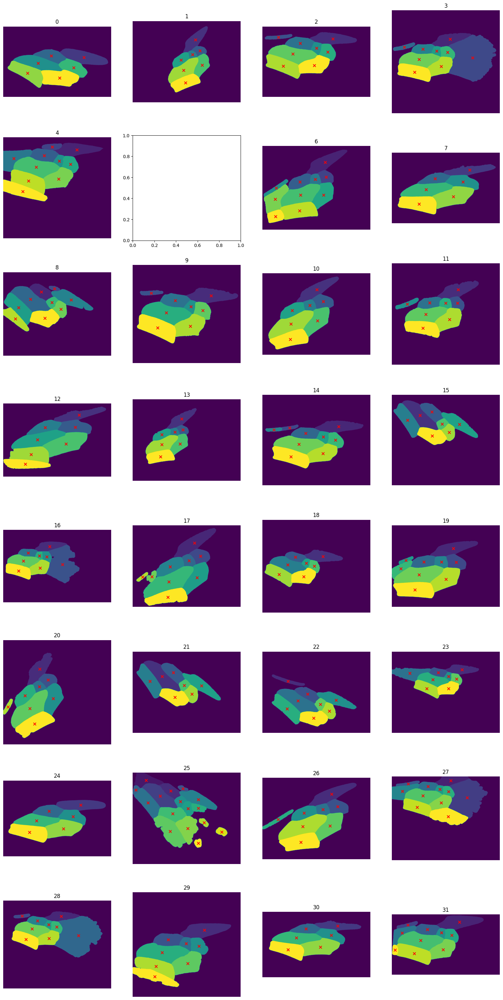

In [18]:
from matplotlib import pyplot as plt

fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii in range(bee_wing_images_amount):
    if bee_wing_images_labeled[ii] is None:
        continue
    rr, cc = ii // 4, ii % 4
    axes[rr, cc].imshow(bee_wing_images_labeled[ii])
    for region in bee_wing_images_regions[ii]:
        axes[rr, cc].scatter([region.centroid[1]], [region.centroid[0]], marker="x", color="red")
    axes[rr, cc].set_title(str(ii))
    axes[rr, cc].axis("off")

After labelization there are a lot of useless cells still.

# 3. Identification

The main goal is to isolate some specific cells.

<img alt="Cell Labels" src="./ressources/cell_labels.png">

There are at most 7 interesting cells:
- First submarginal cell
- Second submarginal cell
- Third submarginal cell
- First medial cell
- Second medial cell
- Second cubital cell
- Marginal cell

> [!WARNING]  
> Some species have their second and third **submarginal** cells merged toghether.

Each region has an attribute called orientation, which, simply speaking, represents the angle between its major axis and the x axis.

We can compute a weighted global orientation so that we can find a reference point.

The orientation that skimage computes is not too intuitive, we'll fix that.

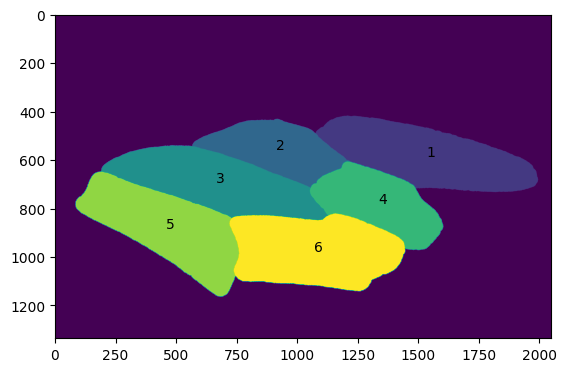

In [19]:
plt.imshow(bee_wing_images_labeled[0])
for region in bee_wing_images_regions[0]:
    plt.text(region.centroid[1], region.centroid[0], str(region.label))

In [20]:
def iort_get(ort):
    iort = ort * (180 / np.pi) - 90
    if iort < -90:
        iort += 180
    elif iort > 90:
        iort -= 180
    return iort


iorts = []  # intuitive orientation (degrees)
for region in bee_wing_images_regions[0]:
    iorts.append(iort_get(region.orientation))
    print(region.label, region.orientation, iorts[-1])

# compute weighted intuitive orientation (degrees)
w = np.array([r.area for r in bee_wing_images_regions[0]])
w = w / w.max()
wiort = np.average(iorts, weights=w)
print(wiort)

1 1.3442600602926542 -12.979571977229341
2 1.3646876076627992 -11.809159727116466
3 1.3431286659511483 -13.044396097962604
4 1.1604882636598421 -23.50892031782594
5 1.075757694606442 -28.363624320327553
6 1.515674674172178 -3.158238055067997
-15.057487740760681


In [21]:
bee_wing_regions_wiort = []
for ii in range(bee_wing_images_amount):
    if bee_wing_images_bin[ii] is not None:
        iorts = [iort_get(r.orientation) for r in bee_wing_images_regions[ii]]
        w = np.array([r.area for r in bee_wing_images_regions[ii]])
        w = w / w.max()
        wiort = np.average(iorts, weights=w)
        bee_wing_regions_wiort.append(wiort)
    else:
        bee_wing_regions_wiort.append(None)

In [22]:
bee_wing_regions_centroids = []
for ii in range(bee_wing_images_amount):
    if bee_wing_images_bin[ii] is not None:
        centroid = np.mean([r.centroid for r in bee_wing_images_regions[ii]], axis=0)
        bee_wing_regions_centroids.append(centroid)
    else:
        bee_wing_regions_centroids.append(None)

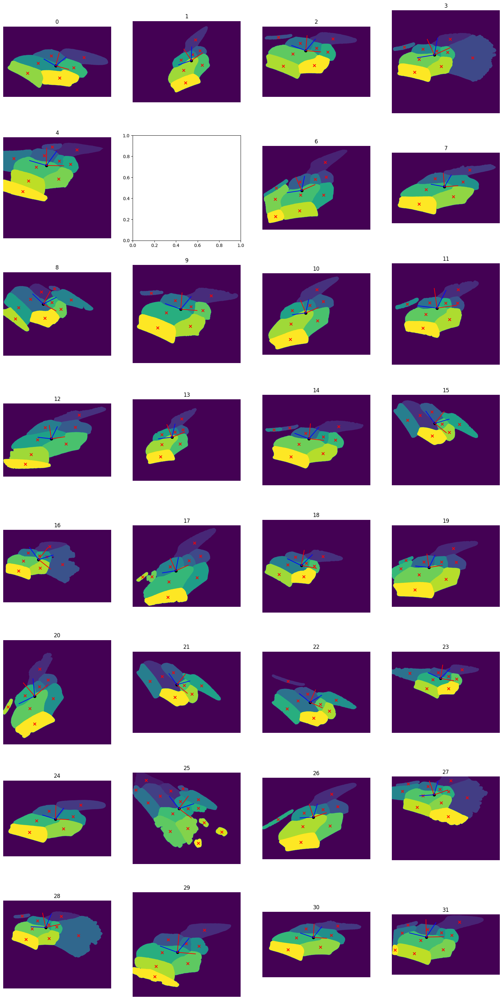

In [23]:
from matplotlib import pyplot as plt

fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii in range(bee_wing_images_amount):
    if bee_wing_images_labeled[ii] is None:
        continue
    rr, cc = ii // 4, ii % 4
    axes[rr, cc].imshow(bee_wing_images_labeled[ii])
    for region in bee_wing_images_regions[ii]:
        axes[rr, cc].scatter([region.centroid[1]], [region.centroid[0]], marker="x", color="red")
    center_y, center_x = bee_wing_regions_centroids[ii]
    axes[rr, cc].scatter([center_x], [center_y], marker="o", color="black")
    wiort_deg = bee_wing_regions_wiort[ii]
    wiort_rad = np.radians(wiort_deg)
    dy = np.sin(wiort_rad) * 256
    dx = np.cos(wiort_rad) * 256
    axes[rr, cc].plot((center_x, center_x + dx), (center_y, center_y - dy), "-r")
    dy = np.sin(np.radians(wiort_deg + 90)) * 256
    dx = np.cos(np.radians(wiort_deg + 90)) * 256
    axes[rr, cc].plot((center_x, center_x + dx), (center_y, center_y - dy), "-r")
    dy = np.sin(np.radians(wiort_deg + 55)) * 256
    dx = np.cos(np.radians(wiort_deg + 55)) * 256
    axes[rr, cc].plot((center_x, center_x + dx), (center_y, center_y - dy), "-b")
    dy = np.sin(np.radians(wiort_deg + 165)) * 256
    dx = np.cos(np.radians(wiort_deg + 165)) * 256
    axes[rr, cc].plot((center_x, center_x + dx), (center_y, center_y - dy), "-b")
    axes[rr, cc].set_title(str(ii))
    axes[rr, cc].axis("off")

We observe that (with some additional preprocessing) we can easily find the first submarginal cell within an angle range. Then, find all the centroids in that range and compute a score for each of them. The score for the first submarginal cell can be computed as the closest centroid with an eccentricity in [0.7, 0.9] (arbitrary range, found empirically).

The same processus can be applied from different centroid and with different angle ranges to find the rest of the cells.

In [24]:
def _compute_adjacency_matrix(img_labeled):
    amt = np.unique(img_labeled).size
    mat = np.zeros((amt, amt), dtype=bool)
    img_sobel = sobel(img_labeled)
    edge_coords = np.column_stack(np.nonzero(img_sobel))
    for yy, xx in edge_coords:
        neighs = np.unique(img_labeled[yy - 1 : yy + 1, xx - 1 : xx + 1])
        if neighs.size > 1:
            for ii in range(neighs.size):
                for jj in range(ii + 1, neighs.size):
                    mat[neighs[ii]][neighs[jj]] = True
                    mat[neighs[jj]][neighs[ii]] = True
    for ii in range(amt):
        mat[ii][ii] = True
    return mat


# remove regions with less than 2 neighbors
def remove_unpopular_cells(img_labeled, regions):
    mat = _compute_adjacency_matrix(img_labeled)
    for ii in range(1, mat.shape[0]):
        namt = np.sum(mat[ii][1:]) - 1
        if namt >= 2:
            continue
        img_labeled[img_labeled == ii] = 0
        for jj in range(len(regions)):
            if regions[jj].label == ii:
                del regions[jj]
                break
    return img_labeled, regions

In [25]:
class BeeWingImage:
    def __init__(self, path):
        self.path = path
        self.img = imread(path)
        self._init_id()
        self._compute_bin()
        if self.ok:
            self._compute_regions()
            self._remove_useless_cells()
            self._compute_intuitive_orientation()
            self._compute_centroids()
            self._compute_config()

    @property
    def ok(self):
        return self.img_bin is not None

    def _init_id(self):
        name = genus_name_from_path(self.path)
        name = name.replace(" ", "_")
        name = name.upper()
        if name not in Genus._member_map_:
            raise ValueError(f"Unknown genus name: {name}")
        self.genus = Genus[name]

    def _compute_bin(self):
        fname = self.path.split("/")[-1]
        if fname in INVALID:
            self.img_bin = None
        elif fname == "85 Lasioglossum rohweri f right 4x.jpg":
            self.img_bin = preprocess_weakly_pronounced(self.img, otsu_block_size=96)
        elif fname == "149 Lasioglossum rohweri f left 4x.jpg":
            self.img_bin = preprocess_weakly_pronounced(self.img, otsu_block_size=64)
        elif fname == "133 Lasioglossum nymphaerum f right 4x.jpg":
            self.img_bin = preprocess_weakly_pronounced(self.img, otsu_block_size=96)
        elif fname in PROBLEMATIC:
            self.img_bin = preprocess_weakly_pronounced(self.img)
        else:
            self.img_bin = preprocess_well_pronounced(self.img)

    def _compute_regions(self):
        self.img_labeled, self.regions = label_cells(self.img_bin)
        self.img_labeled, self.regions = remove_unpopular_cells(
            self.img_labeled, self.regions
        )

    def _compute_weights(self):
        if self.ok:
            weights = np.array([reg.area for reg in self.regions])
            weights = weights / weights.max()
            return weights
        else:
            return None

    def _compute_centroids(self):
        self.centroids = np.array([reg.centroid for reg in self.regions])
        self.centroid = np.mean(self.centroids, axis=0)
        self.wcentroid = np.average(
            self.centroids, axis=0, weights=self._compute_weights()
        )

    def _compute_intuitive_orientation(self):
        for region in self.regions:
            ortdeg = region.orientation * (180 / np.pi) - 90
            if ortdeg < -90:
                ortdeg += 180
            elif ortdeg > 90:
                ortdeg -= 180
            region.intuitive_orientation_degrees = ortdeg
        self.worientation_degrees = np.average(
            [reg.intuitive_orientation_degrees for reg in self.regions],
            weights=self._compute_weights(),
        )

    def _remove_useless_cells(self):
        if not self.ok or len(self.regions) < 8:
            return
        areas = np.array([reg.num_pixels for reg in self.regions])
        ii = np.argsort(areas)
        if areas[ii[-1]] > areas[ii[-2]] * 2:
            # this usually happens when the wing is fully visible
            # the most right cell does not touch the board and therefore is labeled
            reg = self.regions.pop(ii[-1])
            mask = self.img_labeled == reg.label
            self.img_labeled[mask] = 0

    def _centroid_to_region(self, centroid):
        for reg in self.regions:
            if np.allclose(centroid, reg.centroid):
                return reg
        return None

    def _centroids_in_angle_range(self, origin, ortdeg, ardeg):
        centroids = []
        origin_y, origin_x = origin
        ortrad = np.radians(ortdeg)
        uv = np.array([np.cos(ortrad), -np.sin(ortrad)])
        uv = uv / (np.linalg.norm(uv) + 1e-9)
        for centroid in self.centroids:
            uw = np.array([centroid[1] - origin_x, centroid[0] - origin_y])
            uw = uw / (np.linalg.norm(uw) + 1e-9)
            angrad = np.arccos(uv @ uw.T)
            angdeg = np.degrees(angrad)
            if np.cross(uv, uw) > 0:
                angdeg = -angdeg
            if angdeg >= ardeg[0] and angdeg <= ardeg[1]:
                centroids.append(centroid)
            if (ardeg[0] >= 0 and ardeg[1] >= 0) or (ardeg[0] <= 0 and ardeg[1] <= 0):
                angdeg += (-1 if angdeg > 0 else 1) * 360
                if angdeg >= ardeg[0] and angdeg <= ardeg[1]:
                    centroids.append(centroid)
        return centroids

    def _compute_first_submarginal_cell_region(self):
        centroids = self._centroids_in_angle_range(
            self.centroid, self.worientation_degrees, (55, 165)
        )
        centroids_amount = len(centroids)
        if centroids_amount == 0:
            raise ValueError(f"{self.path}: Expected at least one centroid")
        elif centroids_amount == 1:
            return self._centroid_to_region(centroids[0])
        else:
            # the closest and with the largest eccentricity
            bd = float("+inf")
            br = None
            for centroid in centroids:
                d = np.linalg.norm(self.centroid - centroid)
                r = self._centroid_to_region(centroid)
                e = r.eccentricity
                if d < bd and e >= 0.7 and e <= 0.9:
                    br = r
                    bd = d
            if br is None:
                raise ValueError(f"{self.path}: No cell found")
            return br

    def _compute_closest_cell_region_in_angle_range(self, origin, ortdeg, ardeg):
        centroids = self._centroids_in_angle_range(origin, ortdeg, ardeg)
        centroids_amount = len(centroids)
        if centroids_amount == 0:
            raise ValueError(f"{self.path}: Expected at least one centroid")
        distances = np.array([np.linalg.norm(self.centroid - c) for c in centroids])
        region = self._centroid_to_region(centroids[np.argmin(distances)])
        return region

    def _compute_submarginals(self):
        self.first_submarginal_cell_region = (
            self._compute_first_submarginal_cell_region()
        )
        origin = self.first_submarginal_cell_region.centroid
        centroids = self._centroids_in_angle_range(
            origin, self.worientation_degrees, (-25, 0)
        )
        centroids_amount = len(centroids)
        if centroids_amount == 0:
            raise ValueError(f"{self.path}: Expected at least one centroid")
        distances = np.array([np.linalg.norm(origin - c) for c in centroids])
        self.second_submarginal_cell_region = None
        self.third_submarginal_cell_region = None
        ii = np.argsort(distances)
        self.second_submarginal_cell_region = self._centroid_to_region(centroids[ii[0]])
        if centroids_amount >= 2:
            self.third_submarginal_cell_region = self._centroid_to_region(
                centroids[ii[1]]
            )

    def _compute_medials(self):
        self.first_medial_cell_region = (
            self._compute_closest_cell_region_in_angle_range(
                self.centroid, self.worientation_degrees, (-185, -135)
            )
        )
        self.second_medial_cell_region = (
            self._compute_closest_cell_region_in_angle_range(
                self.first_medial_cell_region.centroid,
                self.first_medial_cell_region.intuitive_orientation_degrees,
                (-45, 0),
            )
        )

    def _compute_cubitals(self):
        self.second_cubital_cell_region = (
            self._compute_closest_cell_region_in_angle_range(
                self.first_medial_cell_region.centroid,
                self.first_medial_cell_region.intuitive_orientation_degrees,
                (-135, -90),
            )
        )

    def _compute_marginal(self):
        origin = self.second_submarginal_cell_region.centroid
        centroids = self._centroids_in_angle_range(
            origin, self.worientation_degrees, (25, 75)
        )
        centroids_amount = len(centroids)
        if centroids_amount == 0:
            raise ValueError(f"{self.path}: Expected at least one centroid")
        elif centroids_amount == 1:
            self.marginal_cell_region = self._centroid_to_region(centroids[0])
        else:  # the cell with the greatest eccentricity
            regions = [self._centroid_to_region(c) for c in centroids]
            eccentricities = np.array([reg.eccentricity for reg in regions])
            self.marginal_cell_region = regions[np.argmax(eccentricities)]

    def _compute_config(self):
        self._compute_submarginals()
        self._compute_medials()
        self._compute_cubitals()
        self._compute_marginal()

In [26]:
bee_wing_images = [BeeWingImage(path) for path in bee_wing_image_paths]

/tmp/ipykernel_77330/2256330533.py:10: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  img_bin = remove_small_objects(img_bin)


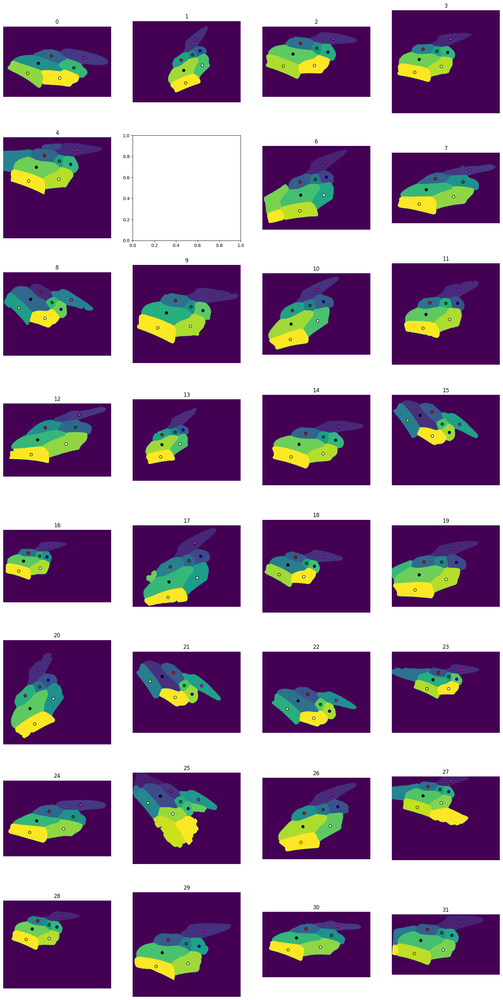

In [27]:
from matplotlib import pyplot as plt

colors = ["red", "green", "blue", "black", "white", "yellow", "magenta"]
fix, axes = plt.subplots(bee_wing_images_amount // 4, 4, figsize=(20, 40))
for ii, bee_wing_image in enumerate(bee_wing_images):
    if not bee_wing_image.ok:
        continue
    rr, cc = ii // 4, ii % 4
    axes[rr, cc].imshow(bee_wing_image.img_labeled)
    regions = [
        bee_wing_image.first_submarginal_cell_region,
        bee_wing_image.second_submarginal_cell_region,
        bee_wing_image.third_submarginal_cell_region,
        bee_wing_image.first_medial_cell_region,
        bee_wing_image.second_medial_cell_region,
        bee_wing_image.second_cubital_cell_region,
        bee_wing_image.marginal_cell_region,
    ]
    for jj, region in enumerate(regions):
        if region is not None:
            yy, xx = region.centroid
            axes[rr, cc].scatter(
                [xx],
                [yy],
                color=colors[jj],
                edgecolor="black",
                marker="o",
            )
    axes[rr, cc].set_title(str(ii))
    axes[rr, cc].axis("off")

The cells are successfully found.

# 4. Features Extraction

Following features are extracted:
- Eccentricity
- Quotient of major axis length over the minor axis length
- First 15 fourier descriptors
- Hu moments
- Quotient of region areas
- Normalized distances between centroids

In [28]:
import numpy as np
from scipy.spatial.distance import pdist


def _compute_fourier_descriptors(coords, n=15):
    complex_coords = np.array([complex(xx, yy) for yy, xx in coords])
    magnitudes = np.abs(np.fft.fft(complex_coords))
    if magnitudes[0] != 0:
        magnitudes = magnitudes / magnitudes[0]
    return magnitudes[:n]


def compute_features(beewingimg):
    if not beewingimg.ok:
        return None
    features = []
    regions = [
        beewingimg.first_submarginal_cell_region,
        beewingimg.second_submarginal_cell_region,
        beewingimg.third_submarginal_cell_region,
        beewingimg.marginal_cell_region,
        beewingimg.first_medial_cell_region,
        beewingimg.second_medial_cell_region,
        beewingimg.second_cubital_cell_region,
    ]
    for region in regions:
        if region is None:
            features.extend([np.nan] * 24)  # 2 + 15 + 7
            continue
        features.append(region.eccentricity)
        features.append(region.major_axis_length / region.minor_axis_length)
        features.extend(_compute_fourier_descriptors(region.coords, n=15))
        for hu_moment in region.moments_hu:
            features.append(hu_moment)
    regions_amount = len(regions)
    rois_areas = [None if region is None else region.num_pixels for region in regions]
    for ii in range(regions_amount):
        for jj in range(ii + 1, regions_amount):
            if rois_areas[ii] is not None and rois_areas[jj] is not None:
                features.append(rois_areas[ii] / rois_areas[jj])
            else:
                features.append(np.nan)
    rois_centroids = [None if region is None else region.centroid for region in regions]
    rois_centroids_distances = []
    for ii in range(regions_amount):
        for jj in range(ii + 1, regions_amount):
            if rois_centroids[ii] is not None and rois_centroids[jj] is not None:
                a = np.array(rois_centroids[ii])
                b = np.array(rois_centroids[jj])
                n = np.linalg.norm(a - b)
                rois_centroids_distances.append(n)
            else:
                rois_centroids_distances.append(np.nan)
    rois_centroids_distances = np.array(rois_centroids_distances)
    max_distance = np.nanmax(rois_centroids_distances)
    features.extend(rois_centroids_distances / max_distance)
    features = np.array(features)
    return features

In [29]:
X, y = [], []
for bee_wing_image in bee_wing_images:
    if bee_wing_image.ok:
        X.append(compute_features(bee_wing_image))
        y.append(bee_wing_image.genus)
X = np.array(X)
y = np.array(y)
X.shape, y.shape

((31, 210), (31,))

Surely enough, there is room for improvement. We can also find the junctions then the veins and extract more features, but for the small dataset we were given, it should be more than enough.

# 5. Classification

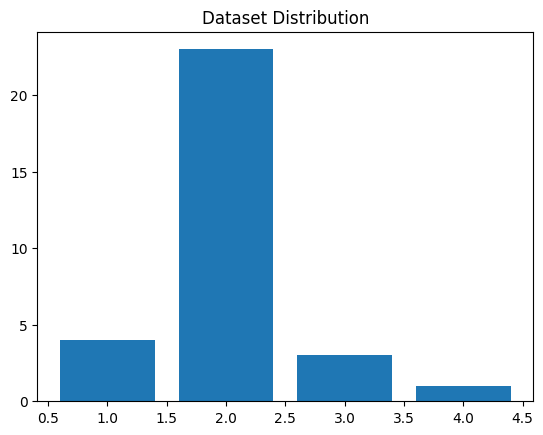

In [30]:
unique, counts = np.unique(y, return_counts=True)
plt.bar(unique, counts)
plt.title("Dataset Distribution")
plt.show()

There is only one sample for the Megachile genus.

In [31]:
features_megachile = X[y == Genus.MEGACHILE]
X = np.vstack((X, features_megachile))
y = np.hstack((y, Genus.MEGACHILE))

### Training

We search for a model able to support `np.nan` values.

In [32]:
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit


def check(model, params, X, y):
    grid = GridSearchCV(
        model,
        param_grid=params,
        cv=StratifiedShuffleSplit(
            n_splits=5,
            test_size=0.2,
            random_state=RANDOM_STATE,
        ),
        n_jobs=8,
        verbose=0,
    )
    grid.fit(X, y)
    return grid

In [33]:
import seaborn as sns


def display_confusion_matrix(y_true, y_pred):
    cmat = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    class_names = [_class.name for _class in Genus]
    sns.heatmap(
        cmat,
        xticklabels=class_names,
        yticklabels=class_names,
        annot=True,
        cmap="Blues",
        fmt="d",
    )
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.title("Confusion Matrix")
    plt.show()

### Hist Gradient Boosting

In [34]:
from sklearn.ensemble import HistGradientBoostingClassifier

grid = check(
    model=HistGradientBoostingClassifier(
        class_weight="balanced",
        random_state=RANDOM_STATE,
    ),
    params={
        "learning_rate": [0.001, 0.01, 0.1, 1],
        "max_iter": [128, 256, 512, 1024],
        "max_leaf_nodes": [2, 4, 8, 16, 32],
        "min_samples_leaf": [1, 2, 4, 8],
    },
    X=X,
    y=y,
)

In [35]:
grid.best_score_, grid.best_params_

(0.9428571428571428,
 {'learning_rate': 0.01,
  'max_iter': 512,
  'max_leaf_nodes': 2,
  'min_samples_leaf': 8})

              precision    recall  f1-score   support

           1       1.00      1.00      1.00         4
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         2

    accuracy                           1.00        32
   macro avg       1.00      1.00      1.00        32
weighted avg       1.00      1.00      1.00        32



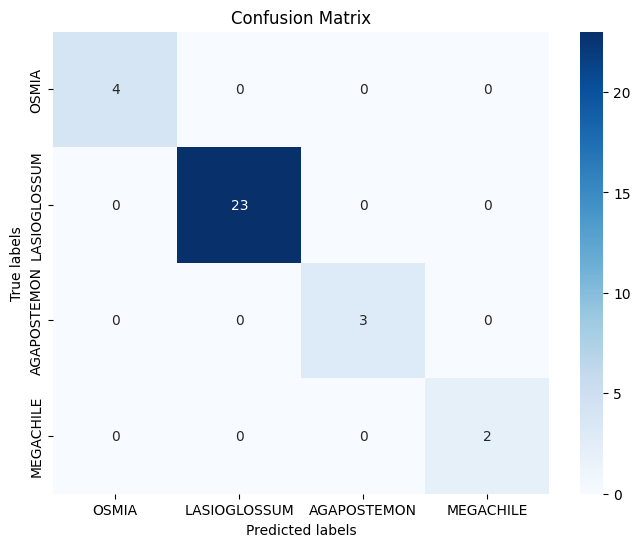

In [36]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred = grid.best_estimator_.predict(X)
print(classification_report(y, y_pred))
display_confusion_matrix(y, y_pred)